# Train a JointVAE model

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import torch

use_cuda = torch.cuda.is_available()
use_cuda

True

In [3]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"  # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = "1"  # change to your device

#### Prepare data list

In [4]:
!ls data

dress_dresslen_train_test_splits.json	dress_sleeve_train_test_splits.json
dress_sleevelen_train_test_splits.json	loadable_women_primary_dress.csv


#### dress sleeve data

In [5]:
import json
with open("./data/dress_sleeve_train_test_splits.json", "r") as infile:
    data_dict = json.load(infile)
    
data_dict.keys()

dict_keys(['X_train_1', 'y_train_1', 'X_test_1', 'y_test_1', 'X_train_2', 'y_train_2', 'X_test_2', 'y_test_2', 'X_train_3', 'y_train_3', 'X_test_3', 'y_test_3', 'X_train_4', 'y_train_4', 'X_test_4', 'y_test_4', 'X_train_5', 'y_train_5', 'X_test_5', 'y_test_5', 'X_train_6', 'y_train_6', 'X_test_6', 'y_test_6', 'X_train_7', 'y_train_7', 'X_test_7', 'y_test_7', 'X_train_8', 'y_train_8', 'X_test_8', 'y_test_8', 'X_train_9', 'y_train_9', 'X_test_9', 'y_test_9', 'X_train_10', 'y_train_10', 'X_test_10', 'y_test_10'])

In [6]:
image_paths_train = []
image_paths_test = []

root_data_dir = "/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables"

for key, val in data_dict.items():
    if 'X_train' in key:
        image_paths_train.extend([root_data_dir + imgpath for imgpath in val])
    elif 'X_test' in key:
        image_paths_test.extend([root_data_dir + imgpath for imgpath in val])

print(f"Number of train image paths: {len(image_paths_train):,d}")
print(f"Number of test image paths: {len(image_paths_test):,d}")
print()
print("Sample paths:")
print(image_paths_train[0])
print(image_paths_train[-1])
print(image_paths_test[0])
print(image_paths_test[-1])

Number of train image paths: 207,603
Number of test image paths: 23,067

Sample paths:
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/8/2893552_3773662.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/7/2713940_3640098.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/2/8/2856150_3749586.jpg
/home/jovyan/vmldata/raw_source_data/v20180810_all_wearables/3/0/3058817_8191784.jpg


#### loadable dresses data

### Create data loaders

In [8]:
from torchvision import transforms
from utils.dataloader_tools import get_imagelist_dataloader, ImageListDataset

BATCH_SIZE = 64

composed = transforms.Compose([transforms.CenterCrop((256,256)),transforms.Resize((256,256)),transforms.ToTensor()])

# convert rgb is for the cv2 loaded images that I've got in this dir
train_dataset = ImageListDataset(image_paths_train, cut_from='top', cut_amount=256, transform=composed, 
                                 convert_rgb=False, error_handling=True)
test_dataset = ImageListDataset(image_paths_test, cut_from='top', cut_amount=256, transform=composed, 
                                convert_rgb=False, error_handling=True)

train_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=train_dataset)
test_loader = get_imagelist_dataloader(batch_size=BATCH_SIZE, dataset_object=test_dataset)

### Define latent distribution of the model

In [9]:
# Latent distribution will be joint distribution of 10 gaussian normal distributions
# and one 10 dimensional Gumbel Softmax distribution
latent_spec = {'cont': 20, 'disc': [10, 10, 10]}

### Build a model

In [53]:
from jointvae.models_256_convjump1 import VAE

model = VAE(latent_spec=latent_spec, img_size=(3, 256, 256), use_cuda=use_cuda)

In [54]:
#print(model)

### Train the model

In [55]:
from torch import optim

# Build optimizer
optimizer = optim.Adam(model.parameters(), lr=3e-4, amsgrad=True) # added amsgrad # orig lr 5e-4

In [56]:
from jointvae.training import Trainer
#from jointvae.training_debug import Trainer

# Define the capacities
# Continuous channels
cont_capacity = [0.0, 5.0, 25000, 30.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0
# Discrete channels
disc_capacity = [0.0, 5.0, 25000, 30.0]  # Starting at a capacity of 0.0, increase this to 5.0
                                         # over 25000 iterations with a gamma of 30.0

# Build a trainer
trainer = Trainer(model, optimizer,
                  cont_capacity=cont_capacity,
                  disc_capacity=disc_capacity,
                 use_cuda=use_cuda)

#### Initialize visualizer

In [57]:
#from viz.visualize import Visualizer
from viz.visualize import Visualizer

viz = Visualizer(model)
viz.save_images = False # needed to add this so it returns a tensor

In [ ]:
# Note this should be at least 100 epochs for proper training or more but can be less to demo

trainer.train(train_loader, epochs=120, save_training_gif=None)

0/207603	Loss: 24497.545
9600/207603	Loss: 17505.563
12800/207603	Loss: 17043.347
16000/207603	Loss: 17037.146
19200/207603	Loss: 16771.202
22400/207603	Loss: 16613.740
25600/207603	Loss: 16734.944
28800/207603	Loss: 16599.272
32000/207603	Loss: 16407.203
35200/207603	Loss: 16563.165
38400/207603	Loss: 16441.168
41600/207603	Loss: 16400.875
44800/207603	Loss: 16130.815
48000/207603	Loss: 16159.927
51200/207603	Loss: 16011.334
54400/207603	Loss: 16091.991
57600/207603	Loss: 15997.035
60800/207603	Loss: 15946.470
64000/207603	Loss: 16124.052
67200/207603	Loss: 15825.698
70400/207603	Loss: 15990.873
73600/207603	Loss: 16042.135
76800/207603	Loss: 15989.235
80000/207603	Loss: 15872.085
83200/207603	Loss: 15962.586
86400/207603	Loss: 15793.881
89600/207603	Loss: 15697.290
92800/207603	Loss: 15739.307
96000/207603	Loss: 15813.051
99200/207603	Loss: 15780.541
102400/207603	Loss: 15853.616
105600/207603	Loss: 15766.186
108800/207603	Loss: 15761.032
112000/207603	Loss: 15672.171
115200/207603	L

60800/207603	Loss: 14935.838
64000/207603	Loss: 14909.721
67200/207603	Loss: 14887.456
70400/207603	Loss: 14884.636
73600/207603	Loss: 14972.895
76800/207603	Loss: 14850.955
80000/207603	Loss: 14924.125
83200/207603	Loss: 14929.462
86400/207603	Loss: 14903.198
89600/207603	Loss: 14848.509
92800/207603	Loss: 14730.039
96000/207603	Loss: 14973.837
99200/207603	Loss: 14970.782
102400/207603	Loss: 14928.830
105600/207603	Loss: 14819.359
108800/207603	Loss: 14922.530
112000/207603	Loss: 14977.642
115200/207603	Loss: 15025.912
118400/207603	Loss: 14999.641
121600/207603	Loss: 14835.580
124800/207603	Loss: 14938.698
128000/207603	Loss: 14858.710
131200/207603	Loss: 14889.044
134400/207603	Loss: 14901.475
137600/207603	Loss: 14822.630
140800/207603	Loss: 14856.713
144000/207603	Loss: 14949.762
147200/207603	Loss: 14703.349
150400/207603	Loss: 14936.094
153600/207603	Loss: 14848.445
156800/207603	Loss: 14825.260
160000/207603	Loss: 14923.370
163200/207603	Loss: 14892.304
166400/207603	Loss: 147

108800/207603	Loss: 14695.065
112000/207603	Loss: 14686.010
115200/207603	Loss: 14732.924
118400/207603	Loss: 14520.538
121600/207603	Loss: 14597.123
124800/207603	Loss: 14692.421
128000/207603	Loss: 14651.739
131200/207603	Loss: 14627.782
134400/207603	Loss: 14886.944
137600/207603	Loss: 14752.245
140800/207603	Loss: 14590.531
144000/207603	Loss: 14645.634
147200/207603	Loss: 14669.384
150400/207603	Loss: 14641.089
153600/207603	Loss: 14749.884
156800/207603	Loss: 14601.030
160000/207603	Loss: 14595.565
163200/207603	Loss: 14671.539
166400/207603	Loss: 14539.859
169600/207603	Loss: 14716.440
172800/207603	Loss: 14635.454
176000/207603	Loss: 14674.188
179200/207603	Loss: 14654.557
182400/207603	Loss: 14719.353
185600/207603	Loss: 14628.396
188800/207603	Loss: 14547.967
192000/207603	Loss: 14691.183
195200/207603	Loss: 14834.726
198400/207603	Loss: 14604.892
201600/207603	Loss: 14629.643
204800/207603	Loss: 14628.266
Epoch: 9 Average loss: 14655.18
0/207603	Loss: 14500.655
3200/207603	L

153600/207603	Loss: 14444.624
156800/207603	Loss: 14302.027
160000/207603	Loss: 14449.538
163200/207603	Loss: 14352.455
166400/207603	Loss: 14336.652
169600/207603	Loss: 14435.574
172800/207603	Loss: 14357.654
176000/207603	Loss: 14440.159
179200/207603	Loss: 14433.567
182400/207603	Loss: 14408.659
185600/207603	Loss: 14372.065
188800/207603	Loss: 14356.326
192000/207603	Loss: 14515.174
195200/207603	Loss: 14360.172
198400/207603	Loss: 14399.661
201600/207603	Loss: 14379.770
204800/207603	Loss: 14438.118
Epoch: 13 Average loss: 14417.49
0/207603	Loss: 14115.439
3200/207603	Loss: 14400.819
6400/207603	Loss: 14388.338
9600/207603	Loss: 14416.495
12800/207603	Loss: 14362.340
16000/207603	Loss: 14308.822
19200/207603	Loss: 14334.801
22400/207603	Loss: 14437.588
25600/207603	Loss: 14356.110
28800/207603	Loss: 14440.150
32000/207603	Loss: 14265.992
35200/207603	Loss: 14419.459
38400/207603	Loss: 14443.474
41600/207603	Loss: 14440.701
44800/207603	Loss: 14396.109
48000/207603	Loss: 14522.766


198400/207603	Loss: 14275.379
201600/207603	Loss: 14329.946
204800/207603	Loss: 14390.554
Epoch: 17 Average loss: 14327.47
0/207603	Loss: 13597.579
3200/207603	Loss: 14292.047
6400/207603	Loss: 14398.523
9600/207603	Loss: 14312.580
12800/207603	Loss: 14262.628
16000/207603	Loss: 14408.809
19200/207603	Loss: 14390.363
22400/207603	Loss: 14217.665
25600/207603	Loss: 14357.987
28800/207603	Loss: 14332.362
32000/207603	Loss: 14340.211
35200/207603	Loss: 14308.459
38400/207603	Loss: 14413.881
41600/207603	Loss: 14291.486
44800/207603	Loss: 14379.340
48000/207603	Loss: 14528.451
51200/207603	Loss: 14302.166
54400/207603	Loss: 14354.443
57600/207603	Loss: 14438.290
60800/207603	Loss: 14381.730
64000/207603	Loss: 14320.529
67200/207603	Loss: 14230.089
70400/207603	Loss: 14338.443
73600/207603	Loss: 14379.365
76800/207603	Loss: 14324.597
80000/207603	Loss: 14341.258
83200/207603	Loss: 14229.161
86400/207603	Loss: 14129.743
89600/207603	Loss: 14130.603
92800/207603	Loss: 14305.847
96000/207603	L

35200/207603	Loss: 14333.275
38400/207603	Loss: 14388.504
41600/207603	Loss: 14356.723
44800/207603	Loss: 14257.508
48000/207603	Loss: 14236.818
51200/207603	Loss: 14253.135
54400/207603	Loss: 14356.513
57600/207603	Loss: 14288.410
60800/207603	Loss: 14288.958
64000/207603	Loss: 14284.527
67200/207603	Loss: 14206.076
70400/207603	Loss: 14329.352
73600/207603	Loss: 14247.553
76800/207603	Loss: 14285.315
80000/207603	Loss: 14320.454
83200/207603	Loss: 14316.435
86400/207603	Loss: 14236.570
89600/207603	Loss: 14276.625
92800/207603	Loss: 14297.799
96000/207603	Loss: 14240.048
99200/207603	Loss: 14143.180
102400/207603	Loss: 14244.887
105600/207603	Loss: 14289.293
108800/207603	Loss: 14234.301
112000/207603	Loss: 14318.259
115200/207603	Loss: 14419.724
118400/207603	Loss: 14213.022
121600/207603	Loss: 14353.780
124800/207603	Loss: 14351.183
128000/207603	Loss: 14233.244
131200/207603	Loss: 14195.460
134400/207603	Loss: 14248.782
137600/207603	Loss: 14314.612
140800/207603	Loss: 14278.273
1

83200/207603	Loss: 14275.205
86400/207603	Loss: 14240.114
89600/207603	Loss: 14279.386
92800/207603	Loss: 14198.491
96000/207603	Loss: 14199.900
99200/207603	Loss: 14187.275
102400/207603	Loss: 14234.542
105600/207603	Loss: 14175.400
108800/207603	Loss: 14233.934
112000/207603	Loss: 14286.617
115200/207603	Loss: 14320.121
118400/207603	Loss: 14168.221
121600/207603	Loss: 14203.780
124800/207603	Loss: 14130.678
128000/207603	Loss: 14325.144
131200/207603	Loss: 14226.031
134400/207603	Loss: 14254.129
137600/207603	Loss: 14183.741


In [ ]:
print('Done Training')

In [60]:
print("Testing system")

Testing system


### Visualize

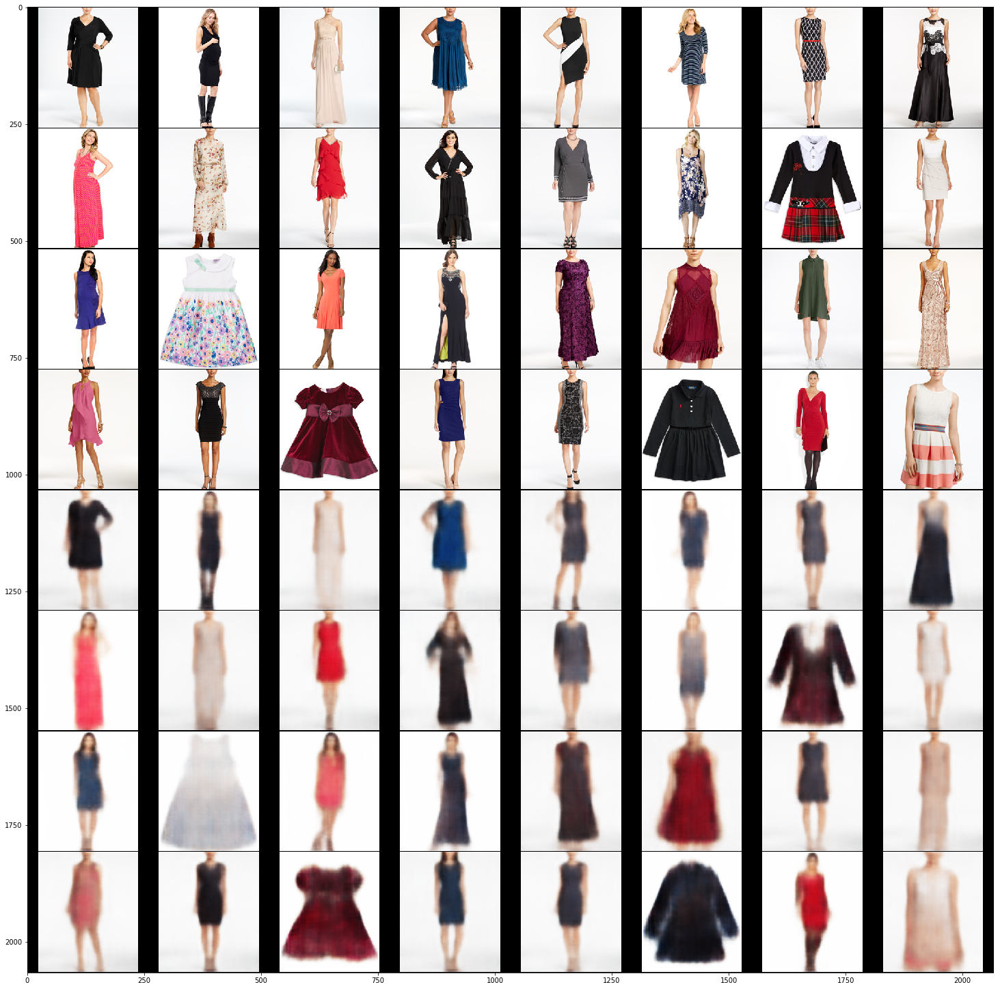

In [64]:
# Plot reconstructions
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Get a batch of data
for batch, labels in test_loader:
    break

# Reconstruct data using Joint-VAE model
recon = viz.reconstructions(batch)

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(recon.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_reconstructions.png",dpi=200)

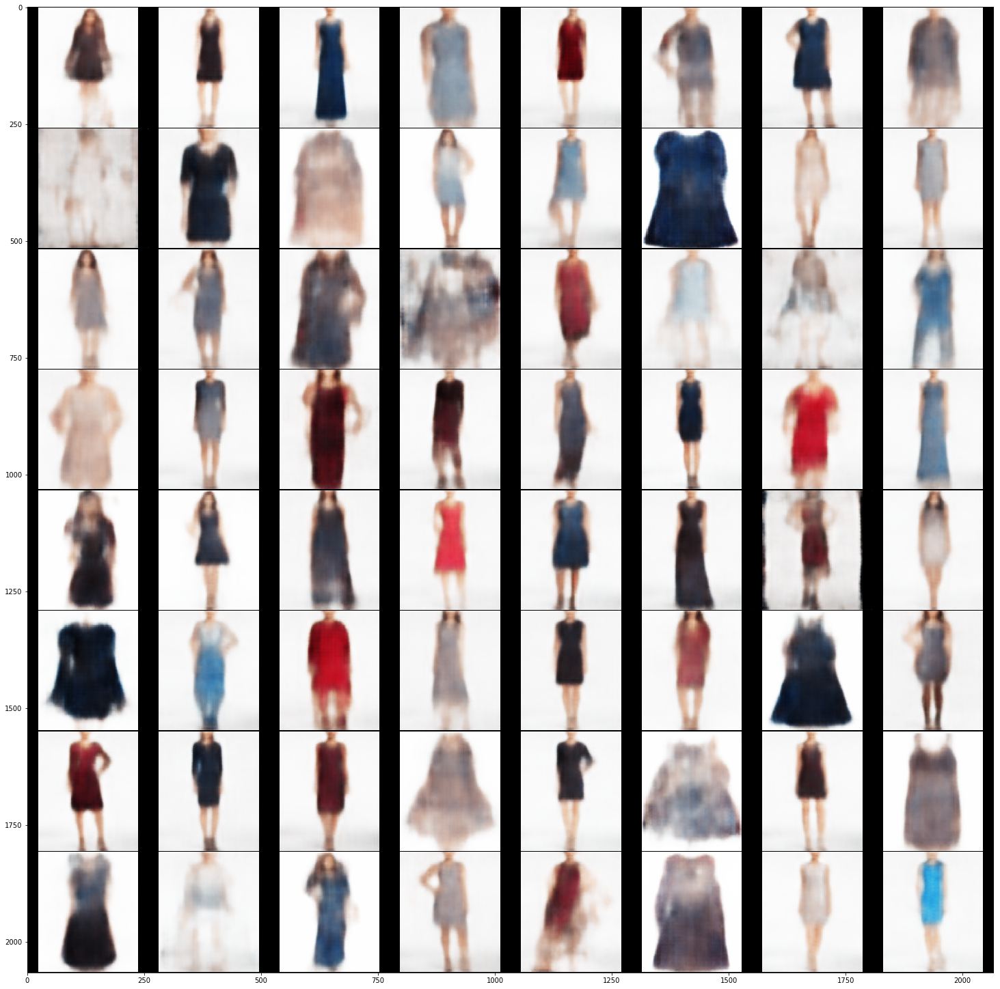

In [65]:
# Plot samples
samples = viz.samples()

plt.figure(figsize=(26,26))
plt.imshow(np.rot90(np.transpose(samples.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_samples.png",dpi=200)

### Note on Traversals

### Traverses all latent dimensions one by one and plots a grid of images where each row corresponds to a latent traversal of one latent dimension
* size: Number of samples for each latent traversal.

In [76]:
print(viz.model.latent_cont_dim, viz.model.num_disc_latents)

20 3


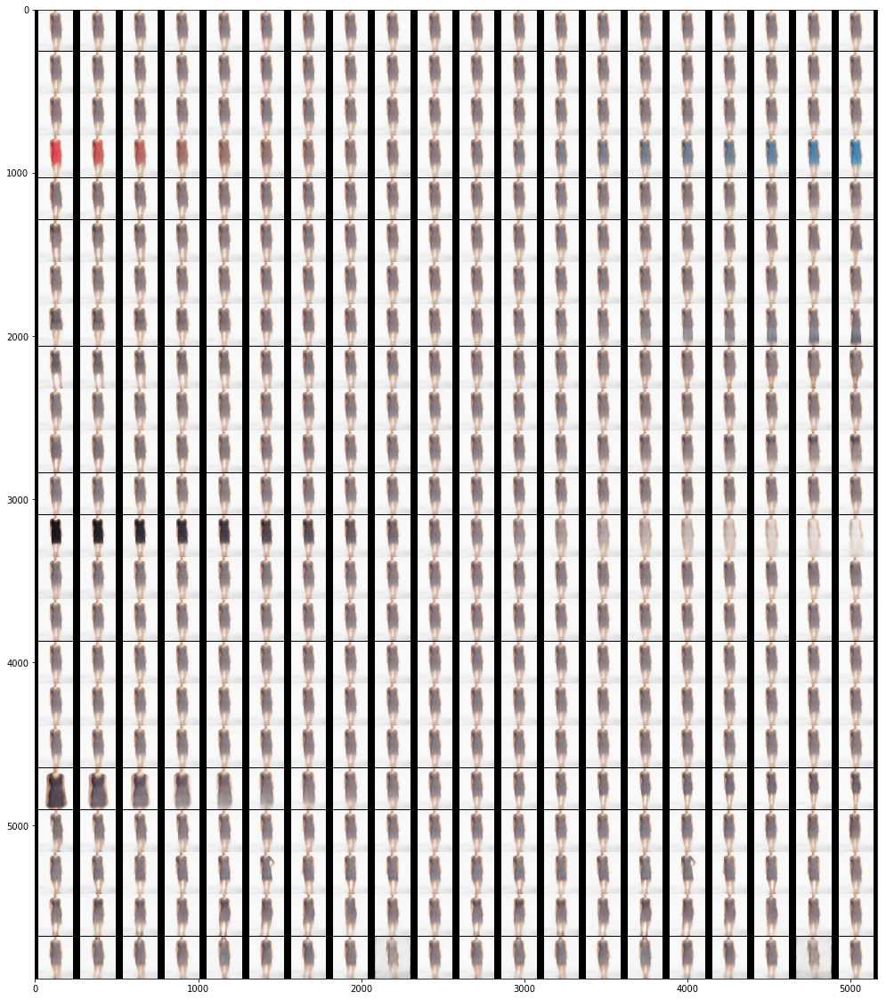

In [81]:
# Plot all traversals
traversals = viz.all_latent_traversals(size=20)

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_all_traversals_n20.png",dpi=200)

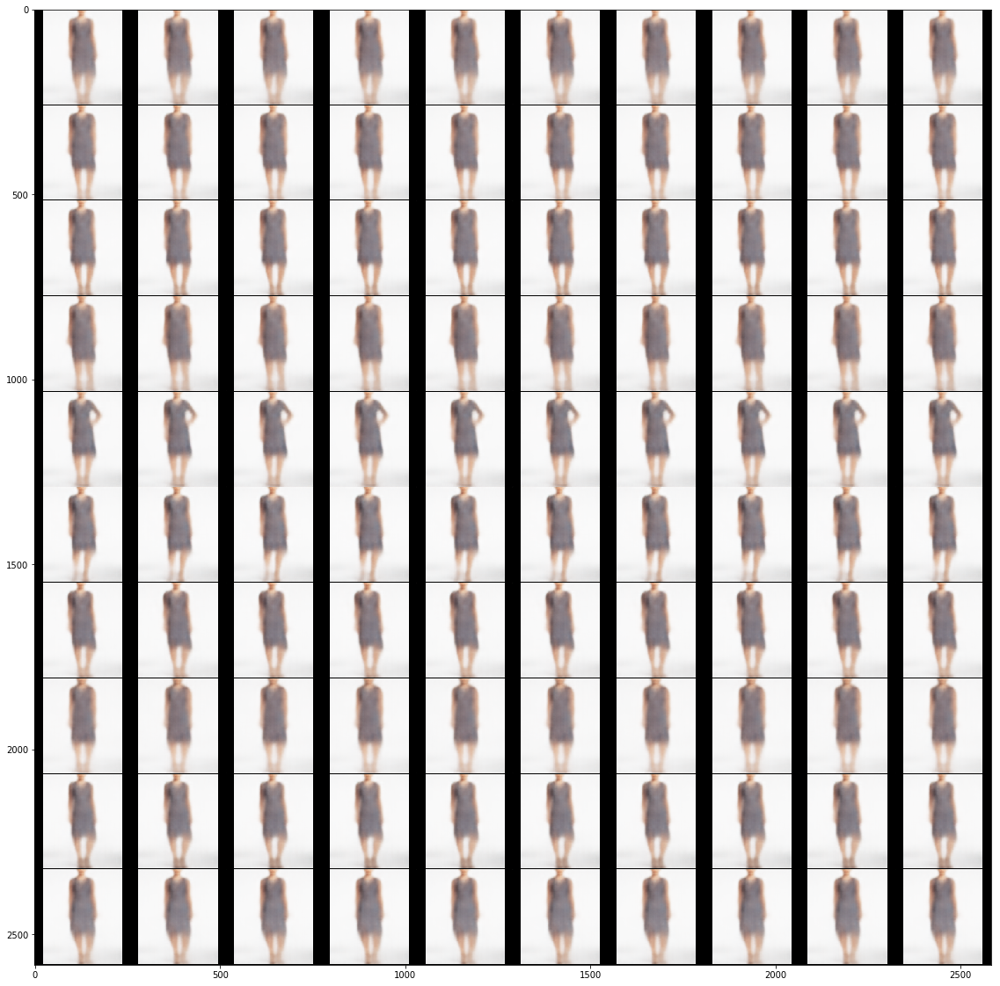

In [68]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals2100.png",dpi=200)

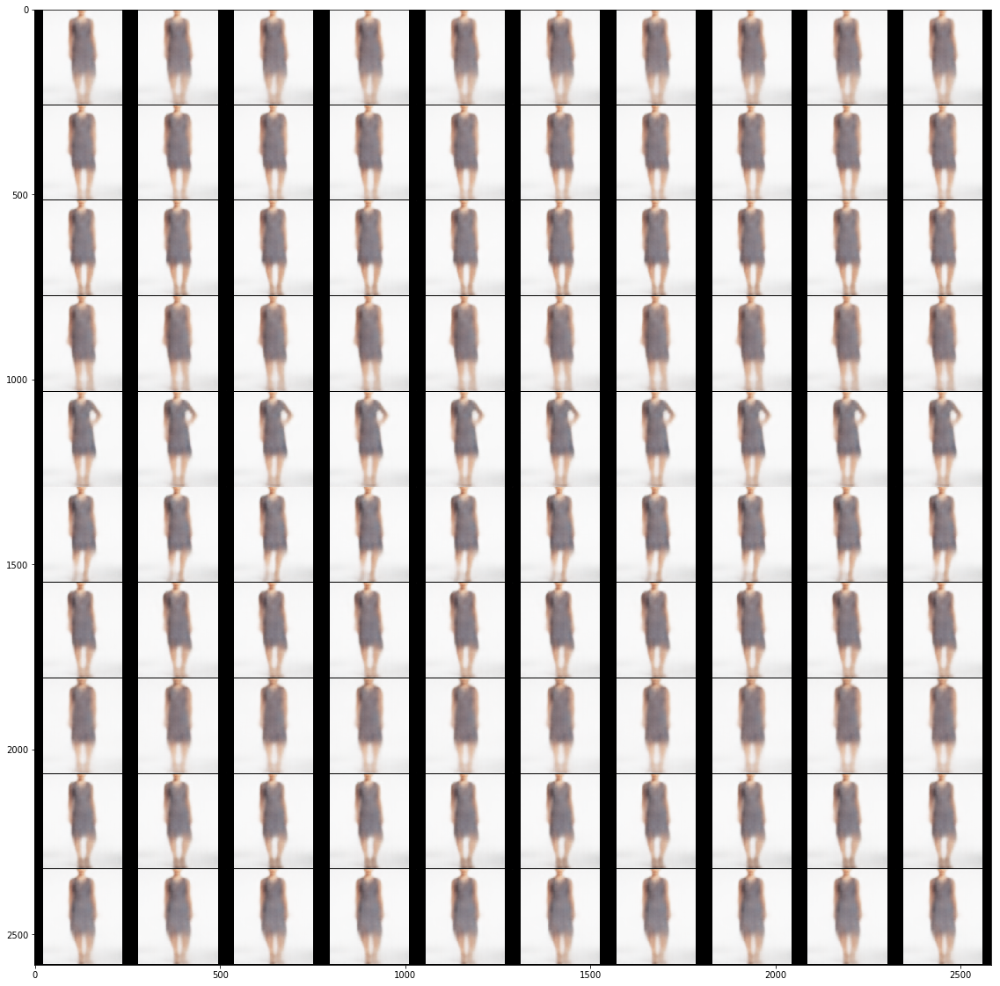

In [69]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=1, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(traversals.numpy()[0, :, :]);
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals1100.png",dpi=200)

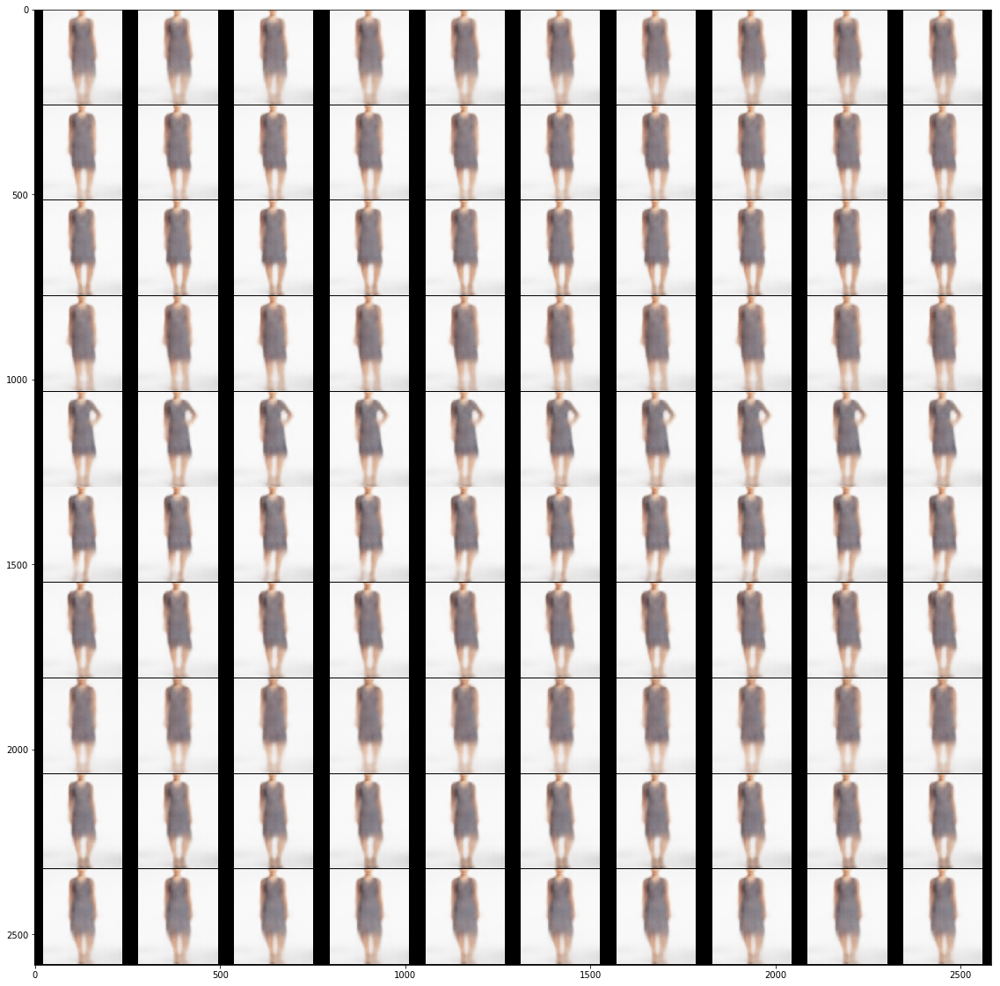

In [73]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=9, cont_axis=1, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals9100.png",dpi=200)

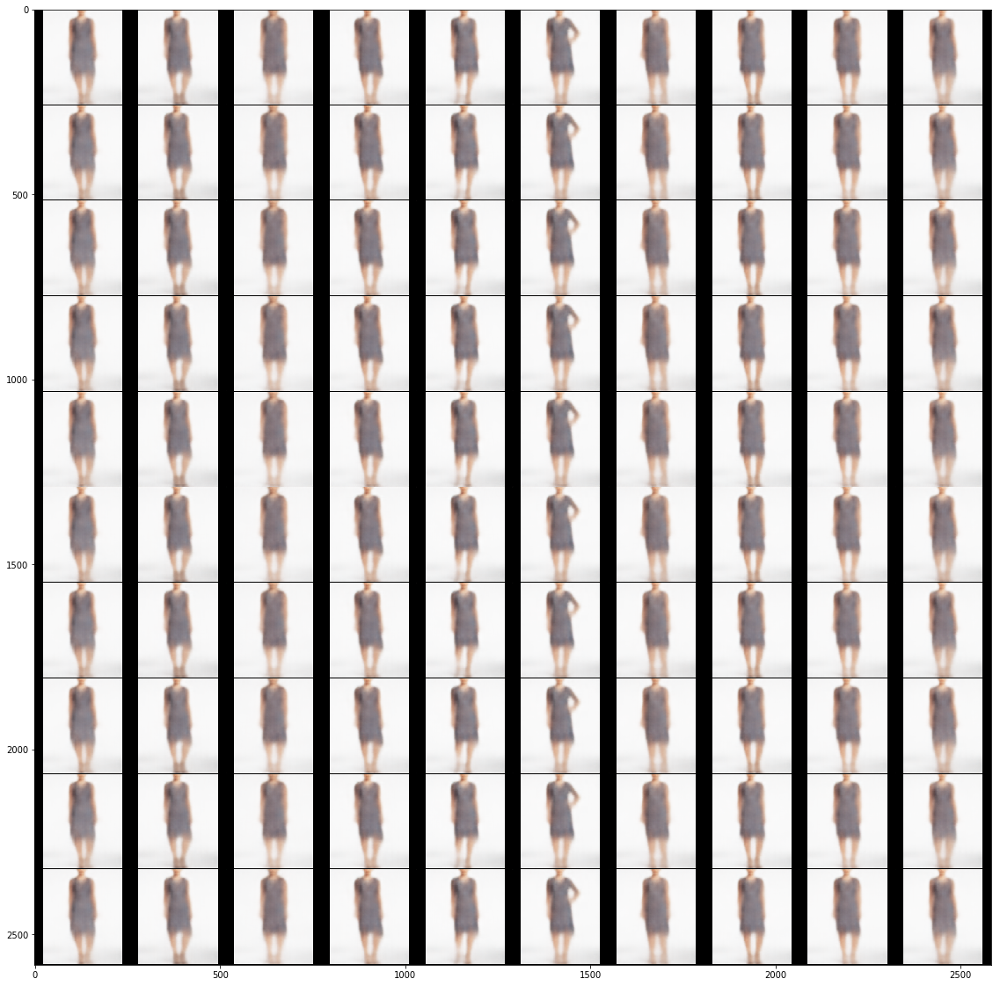

In [71]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=1, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals2101.png",dpi=200)

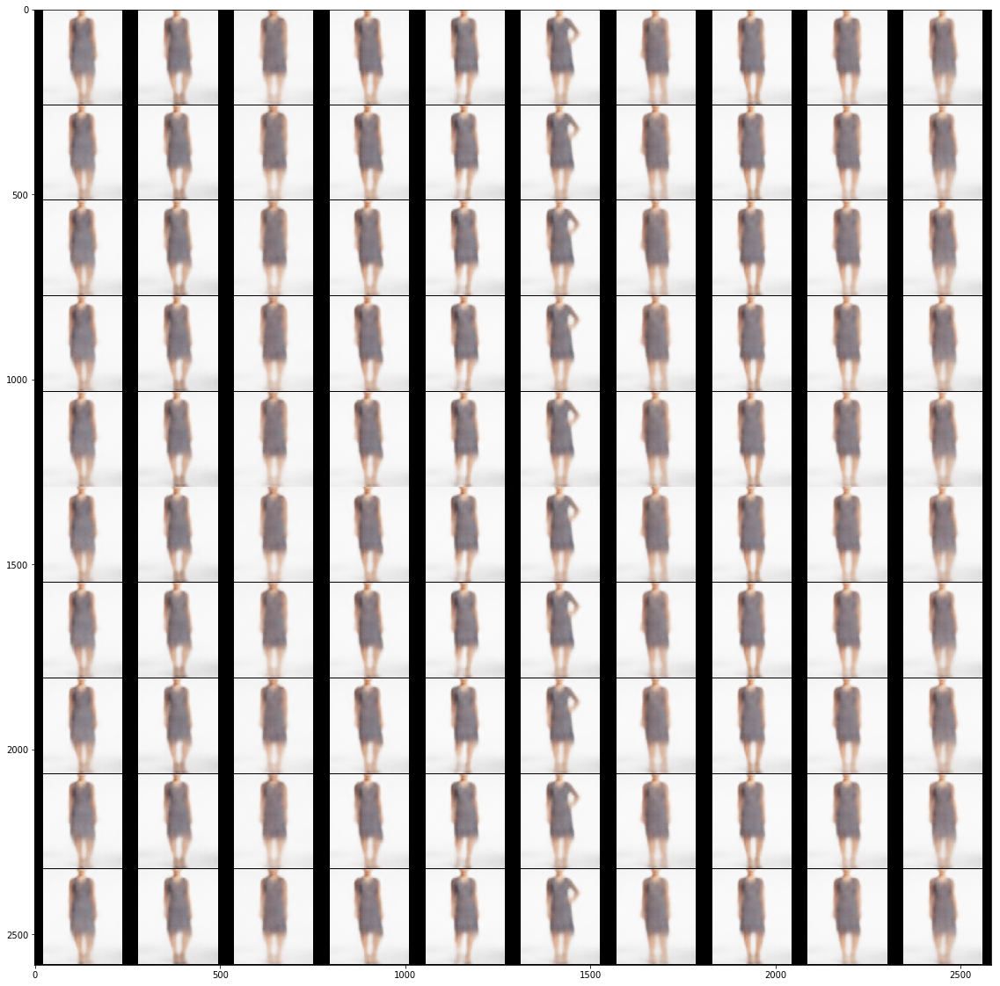

In [72]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=2, cont_axis=0, disc_idx=0, disc_axis=1, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals2001.png",dpi=200)

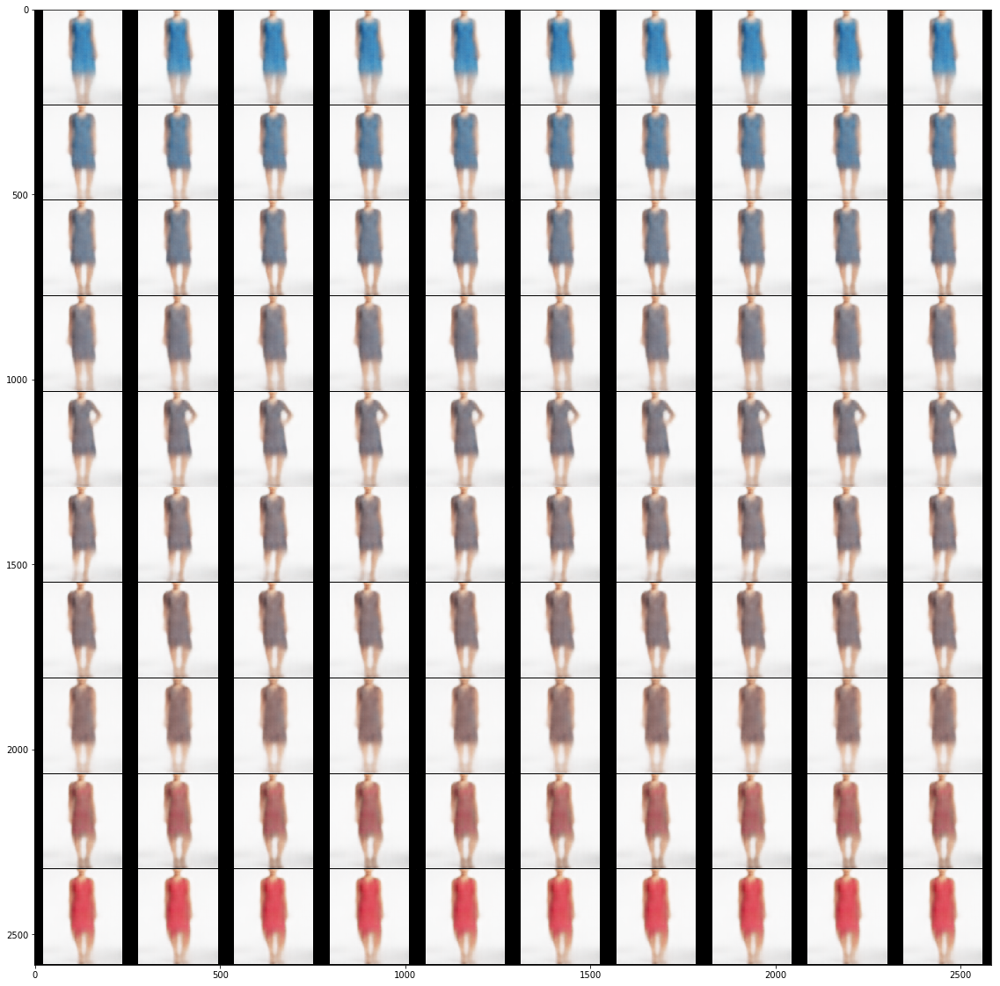

In [82]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=3, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals3000.png",dpi=200)

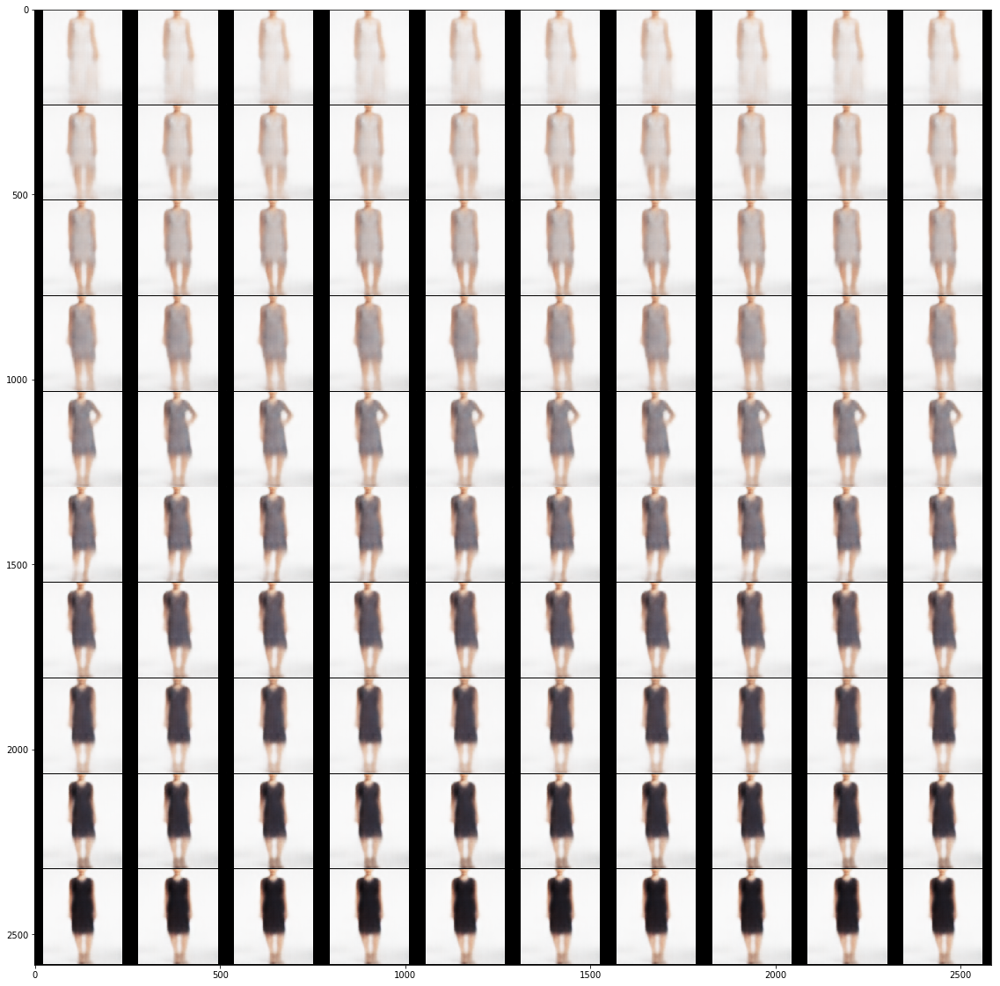

In [83]:
# Plot a grid of some traversals
traversals = viz.latent_traversal_grid(cont_idx=12, cont_axis=0, disc_idx=0, disc_axis=0, size=(10, 10))

plt.figure(figsize=(20,20))
plt.imshow(np.rot90(np.transpose(traversals.numpy(),(2,1,0)),k=3));
plt.savefig("sample_images/306/256/cj1_256_e50maybe_b64_c10d10-10-10_gam30_traversals3000.png",dpi=200)

In [ ]:
!ls

### Save Model

In [34]:
model_name = "xint128_e80_b64_c10d1010_gam30.pth"

In [35]:
torch.save(model.state_dict(),"trained_models/" + "statedict_" + model_name) # save state dict
#torch.save(model, model_name) # save full model

In [36]:
print("Done training: ",model_name)

Done training:  xint128_e80_b64_c10d1010_gam30.pth


#### Restore Model from State Dict

In [ ]:
sd_model = VAE(latent_spec=latent_spec, img_size=(3, 64, 64))
sd_model.load_state_dict(torch.load("statedict_" + model_name))

#### Restore Full Model
* Note in this case the serialized data is bound to the specific classes and exact directory strucutre used.

In [ ]:
full_model = torch.load(model_name)

In [ ]:
type(full_model)

In [ ]:
type(sd_model)

In [ ]:
!ls